## **Malaria Diagnosis using YOLOV5**

# The following codes is the implementation of an object detection model that is trained on thick blood smear. It consists of three main steps:
#1. Setup
#2. Data Assembling
#3. Training and Validation
#4. Testing




#1. Set up

In [ ]:
from google.colab import drive
drive.mount('/content/YoloDrive')

AttributeError: ignored

In [ ]:
# !git clone https://github.com/ultralytics/yolov5

Cloning into 'yolov5'...
remote: Enumerating objects: 15829, done.
remote: Counting objects: 100% (60/60), done.
remote: Compressing objects: 100% (50/50), done.
remote: Total 15829 (delta 21), reused 31 (delta 10), pack-reused 15769
Receiving objects: 100% (15829/15829), 14.60 MiB | 25.29 MiB/s, done.
Resolving deltas: 100% (10835/10835), done.


In [ ]:
#Checcking the NVIDIA GPU specification
!nvidia-smi

Sun Jul 30 18:00:05 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.105.17   Driver Version: 525.105.17   CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   40C    P8     9W /  70W |      0MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
!sudo cp -rf yolov5 YoloDrive/MyDrive/ # In case you want to save your setup on google drive

/content


In [ ]:
!cd /content/YoloDrive/MyDrive/yolov5

In [ ]:
# !cd YoloDrive
!pwd

/content


In [ ]:
!pip install ultralytics==8.0.20

from IPython import display
display.clear_output()

import ultralytics
ultralytics.checks()

Ultralytics YOLOv8.0.20 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 26.3/78.2 GB disk)


In [ ]:
from ultralytics import YOLO
from IPython.display import display, Image

In [ ]:
#Installing all the required dependencies
!pip install -r requirements.txt

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 188.5/188.5 kB 3.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 609.6/609.6 kB 8.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 9.3 MB/s eta 0:00:00
  Attempting uninstall: ultralytics
    Found existing installation: ultralytics 8.0.20
    Uninstalling ultralytics-8.0.20:
      Successfully uninstalled ultralytics-8.0.20


##2. Data Assembling
for our custom training, we need to assemble a dataset of thick bllod smear images of different malaria species with bounding box annotations around the objects that we want to detect. And it is requirement for the dataset to be in yolov5 format as we are training a yolov5 model.

*   The annotation Has been done using vgg image annotator. these annotations as well as images have been uploaded to roboflow
*   The data set is composed of:
        1.   47 P.Falciparum
        2.   80 P.Vivax
        3.   122 P.Ovale
        4.   77 P. Malaria
* Using Data augmentatio  we managed to generate a dataset composed of 700 Images.
*   The dataset has been assembled and transformed into yolov5 format throgh Roboflow.

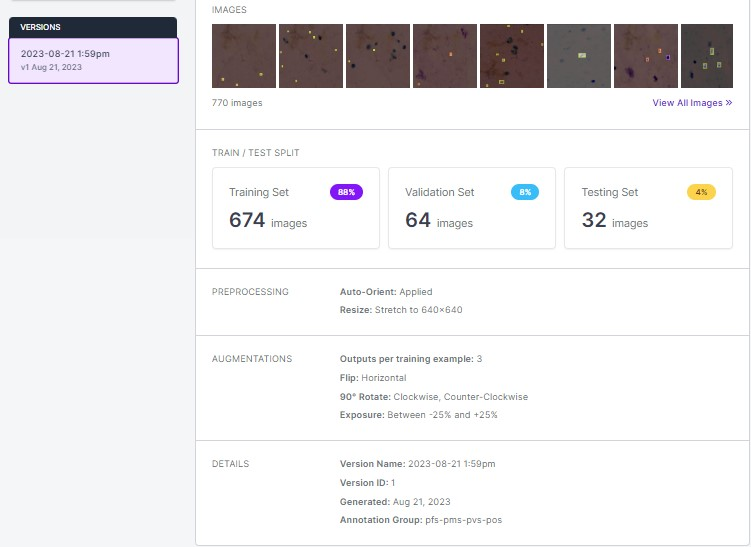
* Then Export the data set and Generate the link to it in roboflow.



In [ ]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="xuEgnRuYQVeSjjpfNcSS")
project = rf.workspace("carnegie-mellon-university-c0qzd").project("parasite_detectorv5")
dataset = project.version(1).download("yolov5")

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.6/57.6 kB 1.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 155.3/155.3 kB 6.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.7/178.7 kB 9.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 7.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.8/67.8 kB 8.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.3/59.3 kB 8.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 7.4 MB/s eta 0:00:00
  Created wheel for wget: filename=wget-3.2-py3-none-any.whl size=9655 sha256=5ac0d34349f0c382fffe25c5f3ce77d46dd81253fedd6ab04632148911fccb8e
  Stored in directory: /root/.cache/pip/wheels/8b/f1/7f/5c94f0a7a505ca1c81cd1d9208ae2064675d97582078e6c769
Successfully built wget
  Attempting uninstall: pyparsing
    Found existing installation: pyparsing 3.1.1
    Uninstalling pyparsing-3.1.1:
      

loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to parasite_detectorv5-1 in yolov5pytorch:: 100%|██████████| 1552/1552 [00:01<00:00, 1199.59it/s]


#3. Training the model using the train.py script and pass the following parameters:

**img**: define input image size


**epochs**: define the number of training epochs. (Note: often, 3000+ are common here!)

**data**: Our dataset locaiton is saved in the dataset.location

**weights**: specify a path to weights to start transfer learning from. Here we choose the generic COCO pretrained checkpoint.

In [ ]:
!python train.py --img 640 --epochs 100 --data parasite_detectorv5-1/data.yaml --weights yolov5s.pt



WARNING ⚠️ Ultralytics settings reset to default values. This may be due to a possible problem with your settings or a recent ultralytics package update. 
View settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.yaml'
Update settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'.
WARNING ⚠️ 'ultralytics.yolo.v8' is deprecated since '8.0.136' and will be removed in '8.1.0'. Please use 'ultralytics.models.yolo' instead.
WARNING ⚠️ 'ultralytics.yolo.utils' is deprecated since '8.0.136' and will be removed in '8.1.0'. Please use 'ultralytics.utils' instead.
Note this warning may be related to loading older models. You can update your model to current structure with:
    import torch
    ckpt = torch.load("model.pt")  # applies to both official and custom models
    torch.save(ckpt, "updated-model.pt")

train: weights=yolov5s.pt, cfg=, data=parasite_detectorv5-1/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=100, batch_size=16, imgsz=64

# Model Evaluation
Training losses and performance metrics are saved to Tensorboard and also to a logfile.

If you are new to these metrics, the one you want to focus on is mAP_0.5

In [ ]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs --port 6009

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

#Run Inference With Trained Weights on the test data set

In [ ]:
!python detect.py --weights /content/YoloDrive/MyDrive/yolov5/runs/train/exp8/weights/best.pt --img 640 --conf 0.3 --source /content/YoloDrive/MyDrive/yolov5/images

WARNING ⚠️ 'ultralytics.yolo.v8' is deprecated since '8.0.136' and will be removed in '8.1.0'. Please use 'ultralytics.models.yolo' instead.
WARNING ⚠️ 'ultralytics.yolo.utils' is deprecated since '8.0.136' and will be removed in '8.1.0'. Please use 'ultralytics.utils' instead.
Note this warning may be related to loading older models. You can update your model to current structure with:
    import torch
    ckpt = torch.load("model.pt")  # applies to both official and custom models
    torch.save(ckpt, "updated-model.pt")

detect: weights=['/content/YoloDrive/MyDrive/yolov5/runs/train/exp8/weights/best.pt'], source=/content/YoloDrive/MyDrive/yolov5/images, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.3, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=F

In [ ]:
# Image(filename='/content/YoloDrive/MyDrive/yolov5/runs/train/exp8/val_batch1_pred.jpg', height=1000)

In [ ]:
# Image(filename='/content/YoloDrive/MyDrive/yolov5/runs/train/exp8/F1_curve.png', height=400,width=1000)

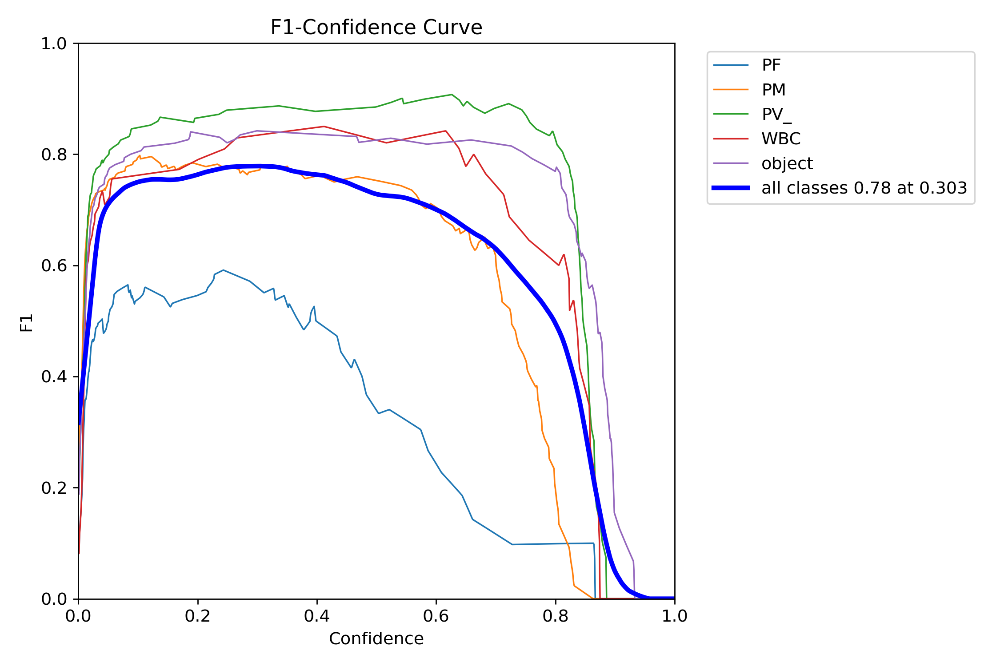

In [ ]:
# Image(filename='/content/YoloDrive/MyDrive/yolov5/runs/train/exp7/F1_curve.png', height=400,width=1000)

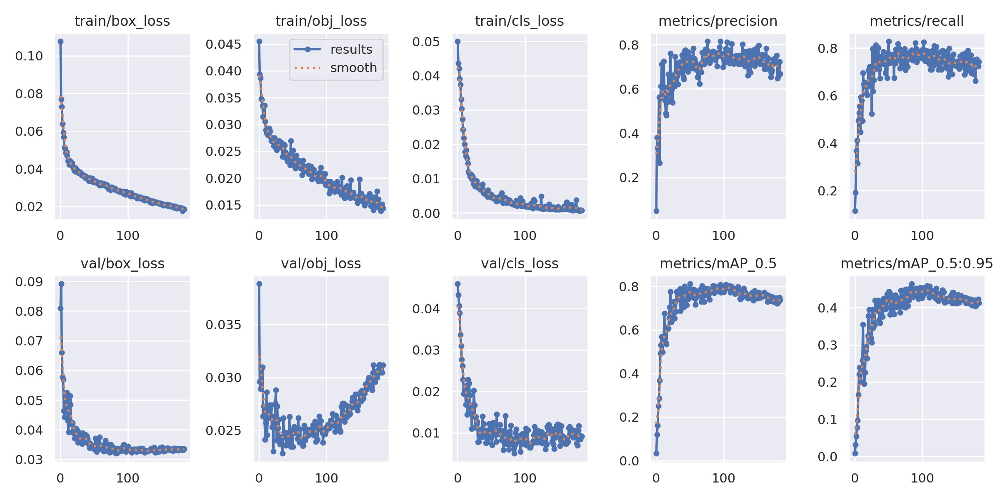

In [ ]:
# Image(filename='/content/YoloDrive/MyDrive/yolov5/runs/train/exp7/results.png', height=400,width=1000)

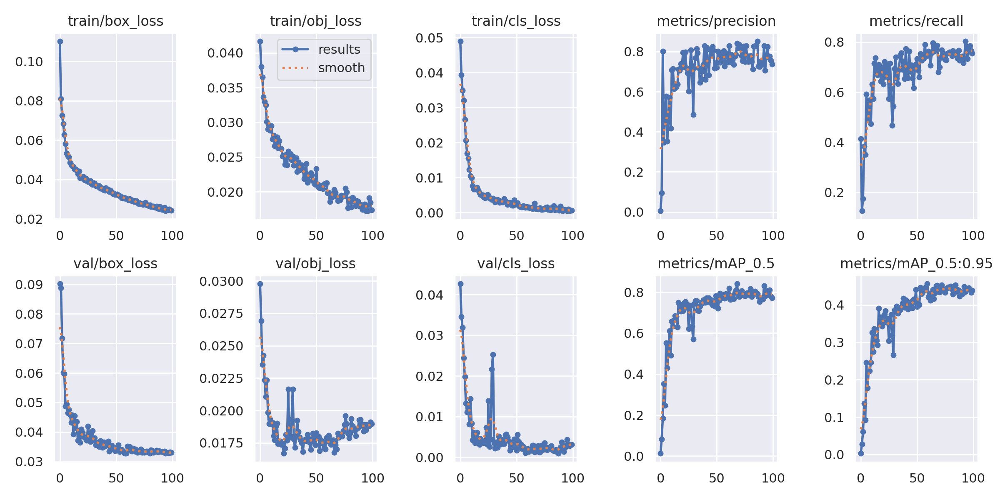

In [ ]:
Image(filename='/content/YoloDrive/MyDrive/yolov5/runs/train/exp8/results.png', height=400,width=1000)

In [ ]:
Image(filename='/content/YoloDrive/MyDrive/yolov5/runs/train/exp7/results.png', height=400,width=1000)

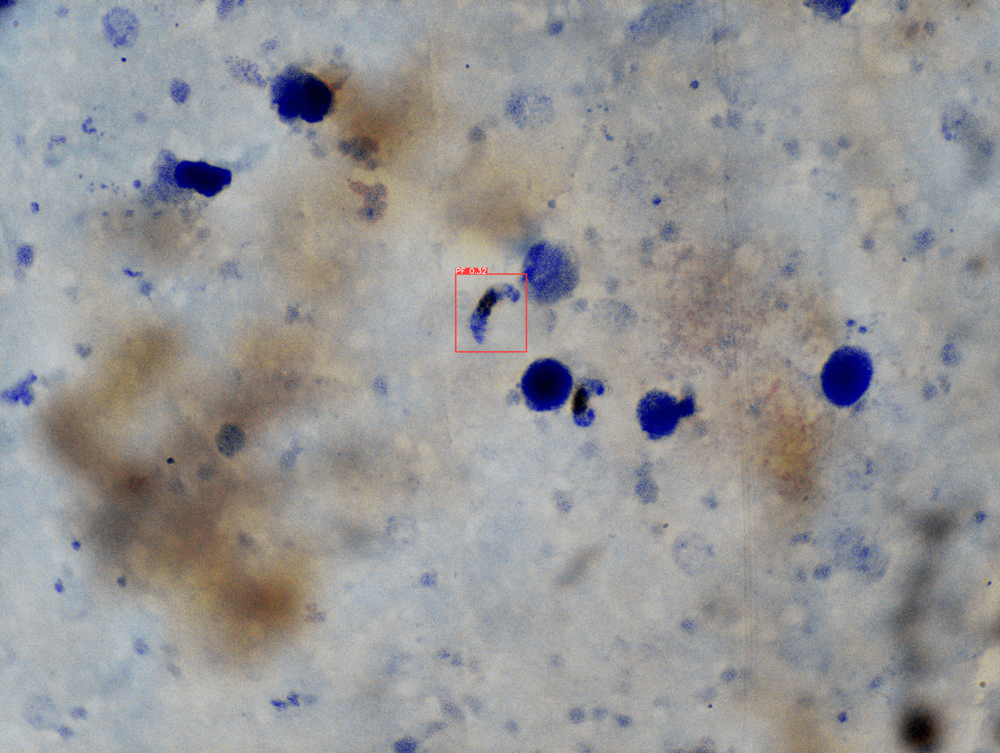

In [ ]:
Image(filename='/content/YoloDrive/MyDrive/yolov5/runs/detect/exp4/pf_18.jpg', height=400,width=1000)

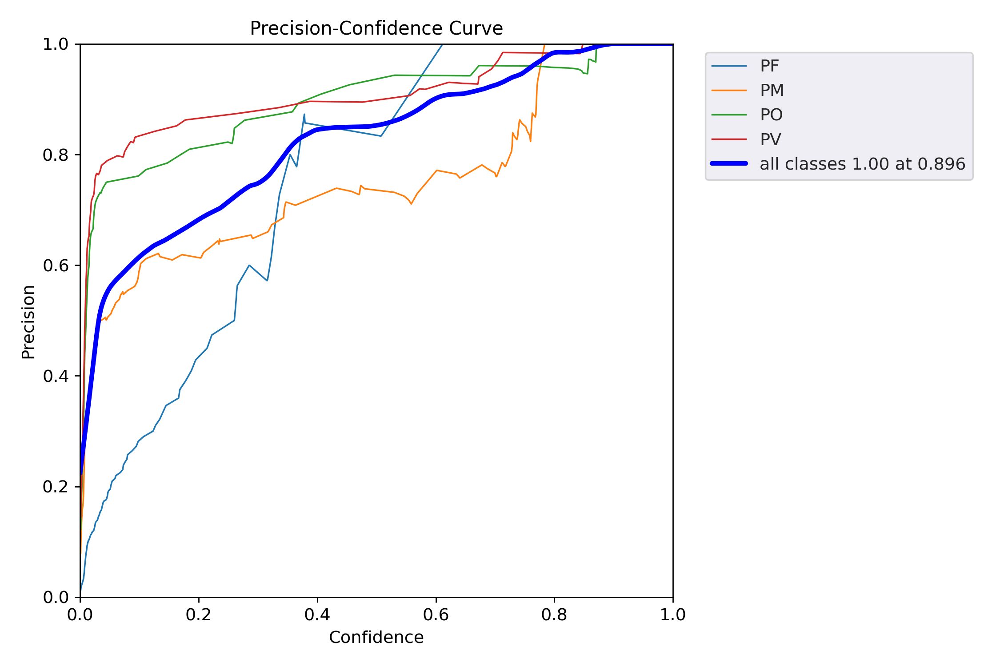

In [ ]:
Image(filename='/content/YoloDrive/MyDrive/yolov5/runs/train/exp8/P_curve.png', height=400,width=1000)

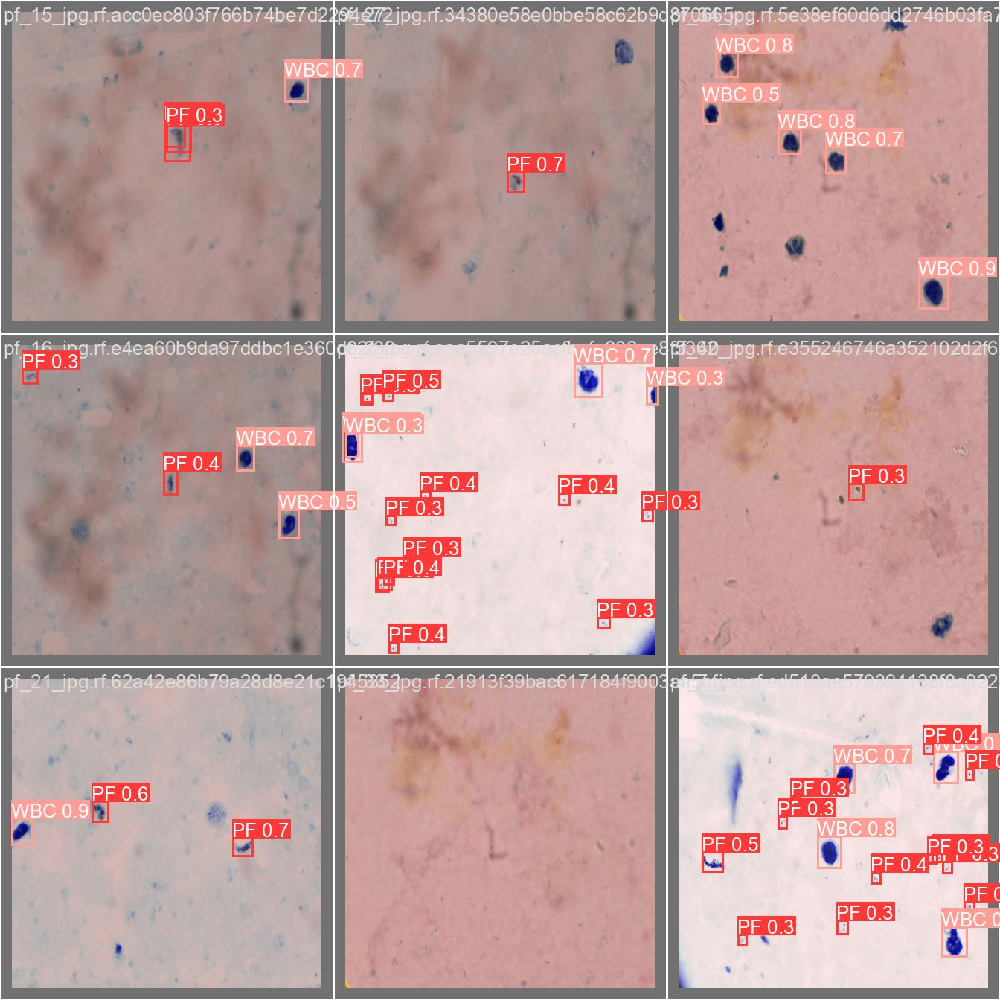

In [ ]:
Image(filename='/content/YoloDrive/MyDrive/Colab Notebooks/yolov5/runs/train/exp2/val_batch1_pred.jpg', height=400,width=1000)

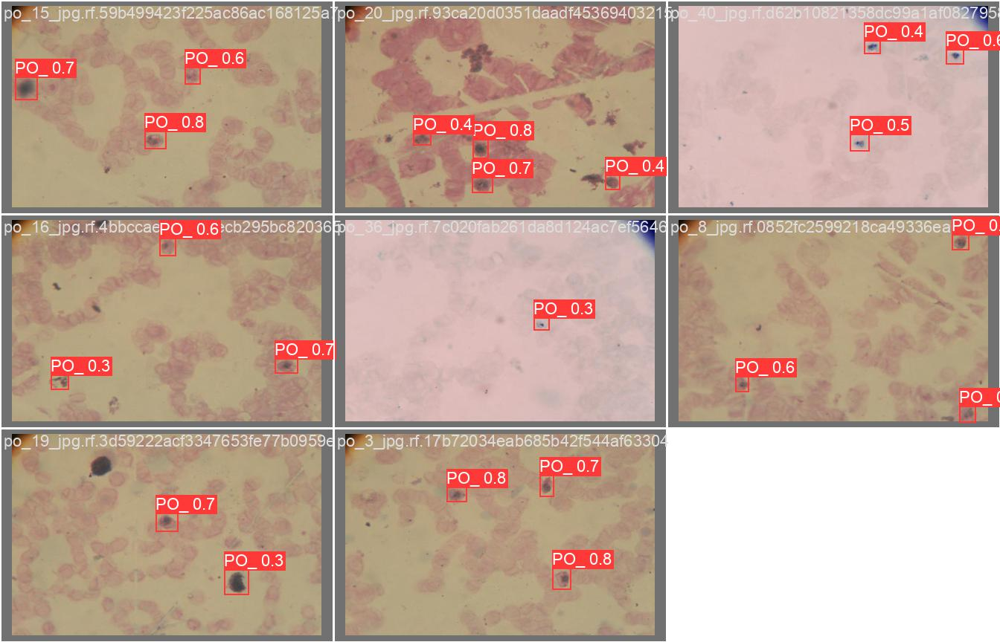

In [ ]:
Image(filename='/content/YoloDrive/MyDrive/Colab Notebooks/yolov5/runs/train/exp5/val_batch0_pred.jpg', height=1000)

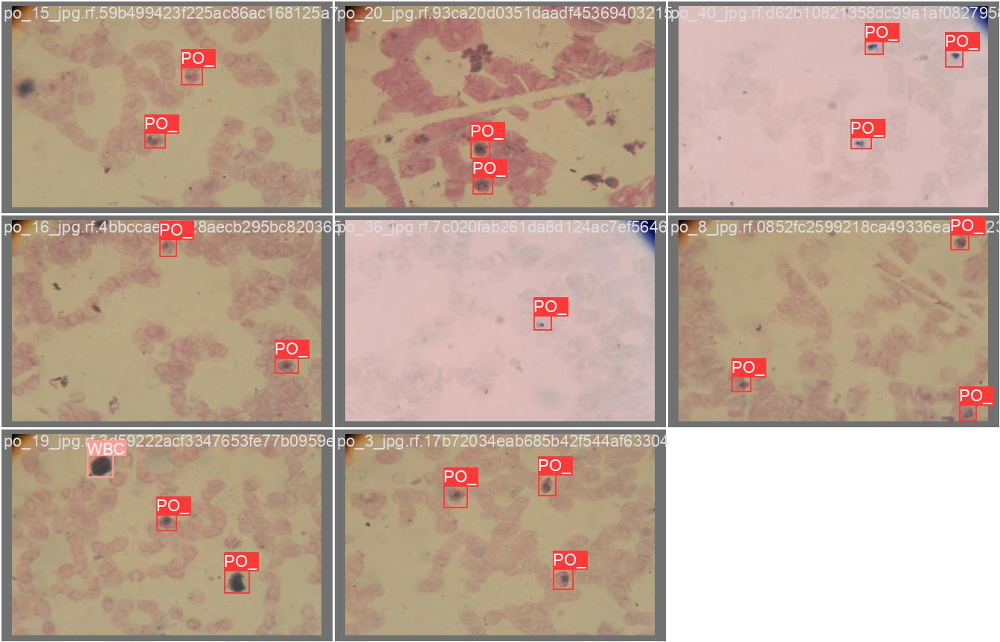

In [ ]:
Image(filename='/content/YoloDrive/MyDrive/Colab Notebooks/yolov5/runs/train/exp4/val_batch0_labels.jpg', height=1000)

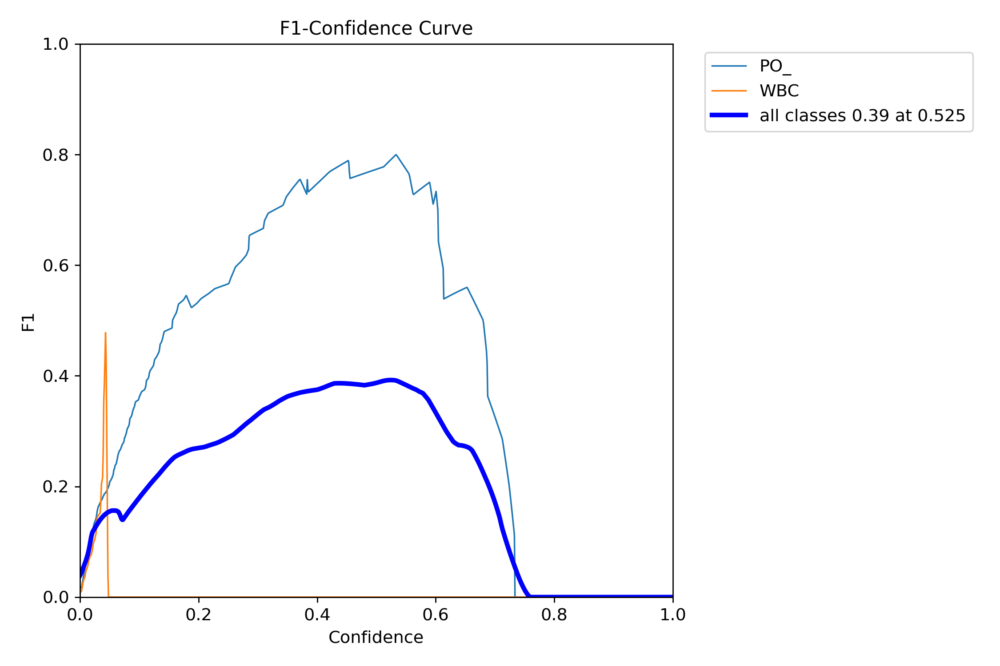

In [ ]:
Image(filename='/content/YoloDrive/MyDrive/Colab Notebooks/yolov5/runs/train/exp4/F1_curve.png', height=300,width=1000)

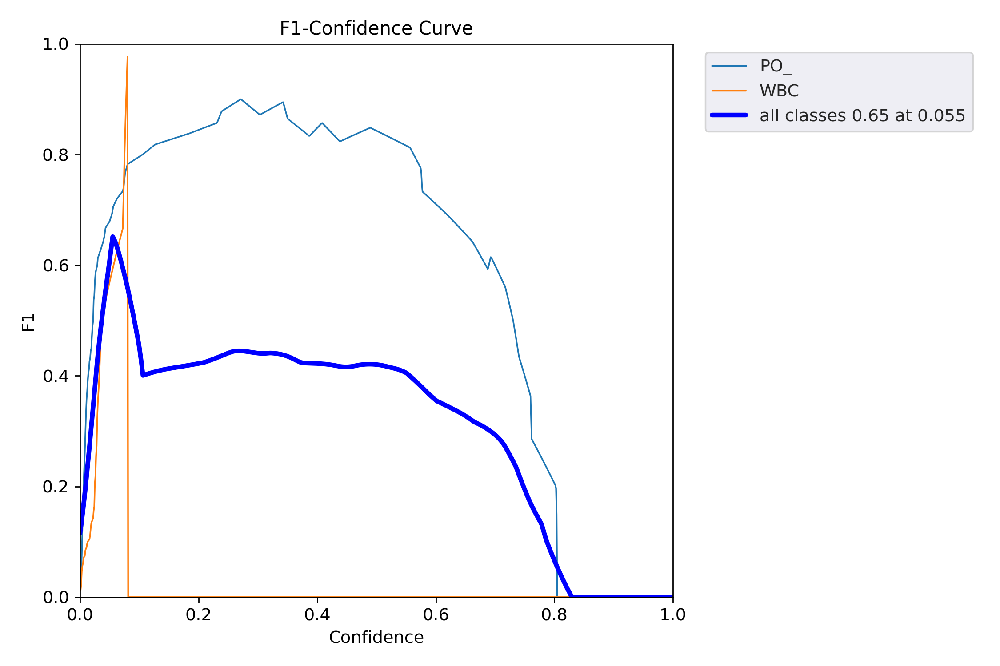

In [ ]:
Image(filename='/content/YoloDrive/MyDrive/Colab Notebooks/yolov5/runs/train/exp5/F1_curve.png', height=300,width=1000)

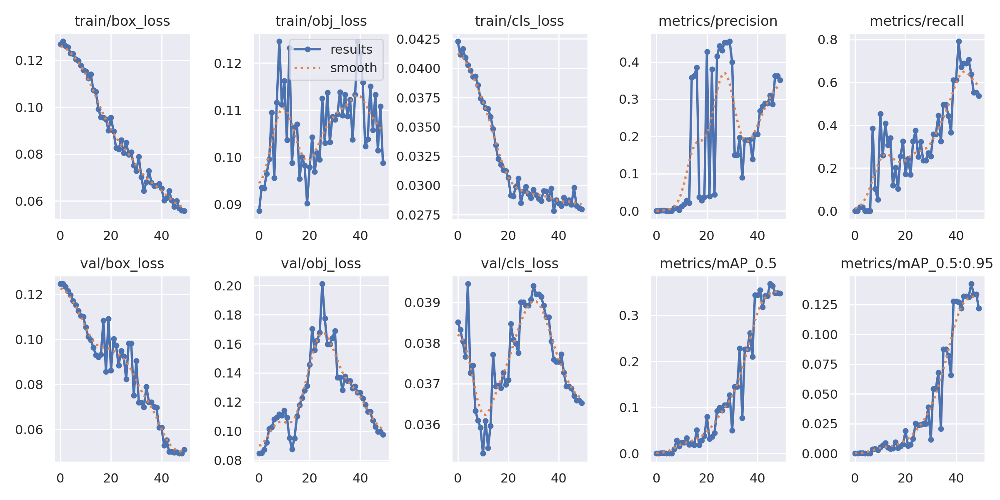

In [ ]:
# /content/YoloDrive/MyDrive/yolov5/runs/train/exp3/results.png
Image(filename='/content/YoloDrive/MyDrive/yolov5/runs/train/exp3/results.png', height=300,width=1000)

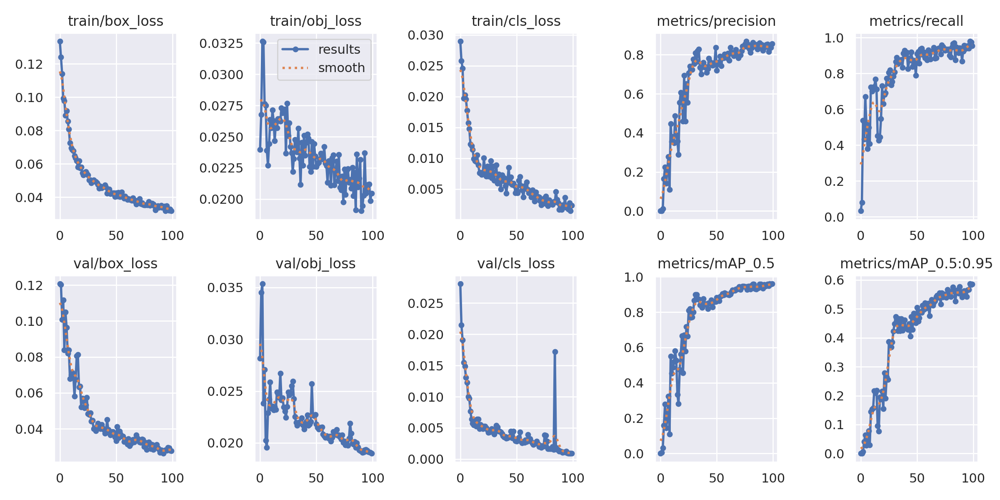

In [ ]:
Image(filename='/content/YoloDrive/MyDrive/Colab Notebooks/yolov5/runs/train/exp8/results.png', height=300,width=1000)

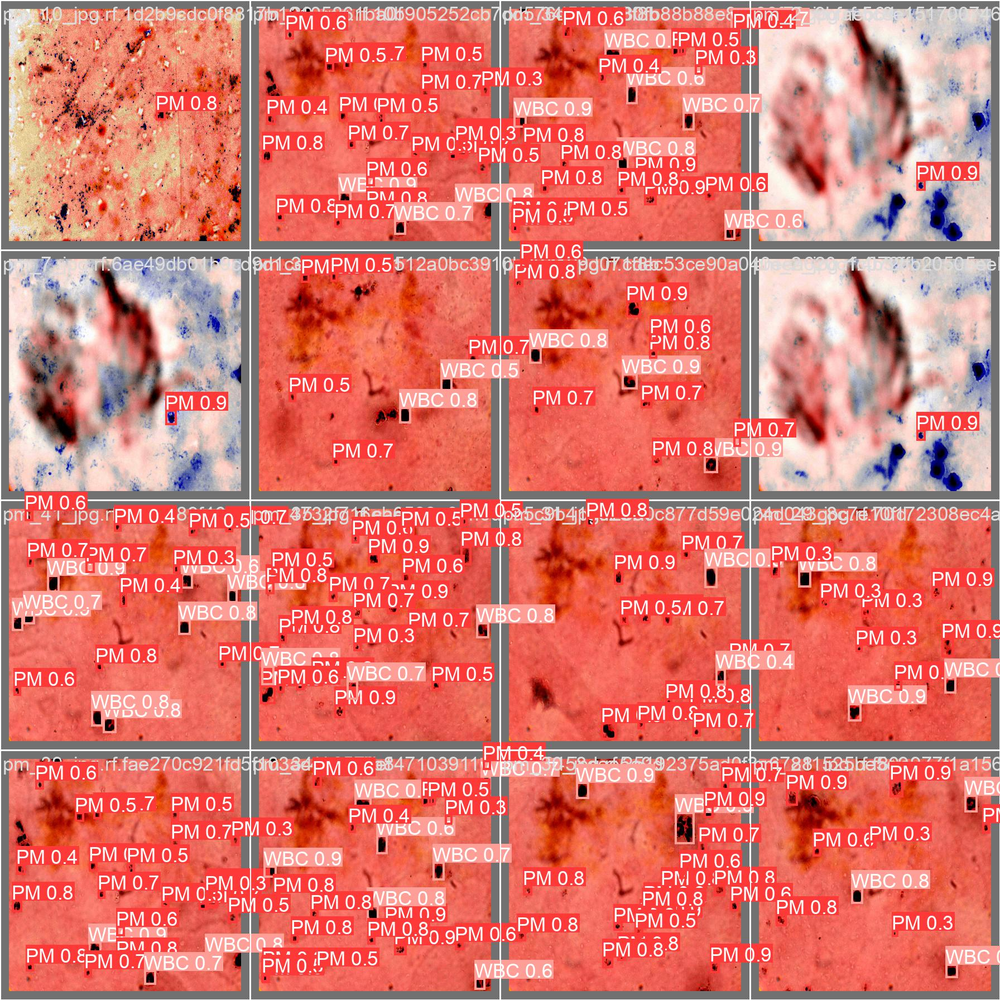

In [ ]:
Image(filename='/content/YoloDrive/MyDrive/Colab Notebooks/yolov5/runs/train/exp6/val_batch0_pred.jpg', height=1000)

In [ ]:
!cd YoloDrive/MyDrive/yolov5

In [ ]:
pwd

'/content'